In [1]:
# python imports
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import corner
import astropy as ap
from astropy.io import fits
import astropy.io.fits as pyfits
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
import pandas as pd
import math
import statistics
import scipy.ndimage as ndimage

# lenstronomy imports
from lenstronomy.Util import util
import lenstronomy.Util.kernel_util as kernel_util
import lenstronomy.Plots.plot_util as plot_util
from lenstronomy.PointSource.point_source import PointSource
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.Data.psf import PSF
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Plots import chain_plot
from lenstronomy.Workflow.fitting_sequence import FittingSequence
from lenstronomy.Util import mask_util
from lenstronomy.ImSim.image_linear_solve import ImageLinearFit

In [2]:
!pip install -U memory-profiler
from memory_profiler import memory_usage

In [3]:
# define some useful functions

def get_data(filename, coadd_id):  
    """Input filename and coadd_id returns fwhm of g,r,i bands and image data"""
    hdu_list = fits.open(filename)
    data = pd.DataFrame(hdu_list[2].data) # get dataframe data
    image = hdu_list['IMAGE'].data # get image data
    hdu_list.close() # close
    return data, image

def plot_image(image_array):
    """Input: image array, Output: plot of image"""
    fig, ax = plt.subplots()
    ax.imshow(image_array, origin = 'lower')    
    
    plt.show()
    plt.close()

def approx_theta_E(center_x, center_y, x_images, y_images): 
    """Input: Lens position (center_x, center_y) and image positions, output: estimated theta_E"""
    d=[]
    for i in range(0, len(x_images)):
        x=float(x_images[i])
        y=float(y_images[i])

        x=center_x-x
        y=center_y-y
        dist=math.sqrt(x**2+y**2)
        d.append(dist)

    theta_E = statistics.mean(d)

    print(f"'Estimated theta_E': {round(theta_E,2)}")
    return theta_E

In [4]:
# set filename
filepath = '/Users/gilliancartwright/Desktop/DES data/' # my personal file path
filename = filepath + 'Rob_candidates.fits'

# show data table for reference
hdu_list = fits.open(filepath+'Rob_candidates.fits')
data = pd.DataFrame(hdu_list[2].data)
hdu_list.close()
#print(data.columns) # view all column names
data.head(3)


,COADD_OBJECT_ID,TILENAME,HPIX_16384,HPIX_4096,DNF_ZMEAN_SOF,RA,DEC,FLUX_RADIUS_G,FLUX_RADIUS_R,FLUX_RADIUS_I,...,FWHM_WMEAN_G,FWHM_WMEAN_R,FWHM_WMEAN_I,FWHM_WMEAN_Z,SKYBRITE_WMEAN_G,SKYBRITE_WMEAN_R,SKYBRITE_WMEAN_I,SKYBRITE_WMEAN_Z,NAME,NAME_FOLDER
0,1400263522,DES0336-2915,2354916223,147182263,0.938449,53.898900,-28.912203,3.962615,4.879757,4.983489,...,1.09654,0.943639,0.817035,0.899360,390.652008,947.728027,3299.189941,7099.970215,DES-691022126,DES0336-2915
1,1325853948,DES0242-0041,1163420627,72713789,0.006323,40.969310,-0.619002,10.245866,10.665524,11.179090,...,1.09442,0.956736,0.894366,0.889644,459.313995,1283.849976,3451.110107,8414.360352,DES-701263907,DES0242-0041
2,1087262176,DES0038-4414,2318857161,144928572,0.545765,10.155908,-44.437518,5.865641,5.180269,5.163048,...,1.28928,1.035290,1.025070,0.777657,406.477997,1063.030029,2966.409912,8586.750000,DES-699919273,DES0038-4414


In [5]:
# DES camera specifics
background_rms = 7.  # background noise per pixel 
exp_time = 90.  # exposure time 
numPix = 46 # number of pixels in image
deltaPix = 0.2637  # pixel size in arcsec
psf_type = 'GAUSSIAN' # psf model choice, 'GAUSSIAN', 'PIXEL'

In [17]:
### MODEL
def model(coadd_id, kwargs_lens_initial, kwargs_lens_light_initial, kwargs_source_initial,
          x_images, y_images, mask_list):
    """ 
    INPUT: coadd_id of image, initial lens model and light parameters, 
    list of x coords and y coords of images, 
    lists of image amplitudes for g,r,i bands,
    OPTIONAL: mask list
    
    OUTPUT: RGB image, observed image, reconstructed image, residuals plot, 
    and results of PSO and MCMC fitting
    
    """
    ## Image data
    data, image = get_data(filename, coadd_id)
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    g = image[row,0,:,:]
    r = image[row,1,:,:]
    i = image[row,2,:,:]
    
    fwhm_g = data.iloc[row,27]
    fwhm_r = data.iloc[row,28]
    fwhm_i = data.iloc[row,29] 
    
    # set models to use
    lens_model_list = ['SIE'] # not using SHEAR because it is too degenerate with model
    source_model_list = ['SERSIC_ELLIPSE'] 
    lens_light_model_list = ['SERSIC_ELLIPSE']
    point_source_list = ['LENSED_POSITION'] # input for point source is image positions, not source position


    
    # generate the coordinate grid and image properties
    ra_grid, dec_grid, ra_at_xy_0, dec_at_xy_0, _, _, Mpix2coord, _ = util.make_grid_with_coordtransform(numPix=numPix, deltapix=deltaPix, center_ra=0, center_dec=0, subgrid_res=1, inverse=False)
    
    # generate image data for each band
    kwargs_data_g = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,  # translate between pixels and RA, DEC
               'image_data': g, # 2d data vector of band image
                    }  
    
    kwargs_data_r = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,  
               'image_data': r,
                    }  
    
    kwargs_data_i = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord, 
               'image_data': i,
                    } 
    if psf_type=='GAUSSIAN':
        # Gauss PSF:
        kwargs_psf_g = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_g, 'pixel_size': deltaPix, 'truncation': 5}
        kwargs_psf_r = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_r, 'pixel_size': deltaPix, 'truncation': 5}
        kwargs_psf_i = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_i, 'pixel_size': deltaPix, 'truncation': 5}

        psf_g = PSF(**kwargs_psf_g)
        psf_r = PSF(**kwargs_psf_r)
        psf_i = PSF(**kwargs_psf_i)

        kernel_g = psf_g.kernel_point_source
        kernel_r = psf_r.kernel_point_source
        kernel_i = psf_i.kernel_point_source

        error_map_g=psf_g.psf_error_map
        error_map_r=psf_r.psf_error_map
        error_map_i=psf_i.psf_error_map


        kwargs_psf_g = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_g, 'kernel_point_source': kernel_g, 'psf_error_map': error_map_g}
        kwargs_psf_r = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_r, 'kernel_point_source': kernel_r, 'psf_error_map': error_map_r}
        kwargs_psf_i = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_i, 'kernel_point_source': kernel_i, 'psf_error_map': error_map_i}
    elif psf_type=='PIXEL':
        # Pixel PSF:
        psf_filename=filepath+'psf_example.fits'
        kernel = pyfits.getdata(psf_filename)
        kernel_blurred = ndimage.filters.gaussian_filter(kernel, 0.5, mode='nearest', truncate=5)

        plt.matshow(np.log10(kernel))
        plt.show()
        plt.close()

        kernel_size=91
        kernel_cut = kernel_util.cut_psf(kernel, kernel_size)
        kernel_cut_blurred = kernel_util.cut_psf(kernel, kernel_size)

        kwargs_psf_g = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_g, 'kernel_point_source': kernel_cut_blurred}
        kwargs_psf_r = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_r, 'kernel_point_source': kernel_cut_blurred}
        kwargs_psf_i = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'fwhm': fwhm_i, 'kernel_point_source': kernel_cut_blurred}

    else:
        print("Invalid psf_type. Choose 'GAUSSIAN' or 'PIXEL'.")
        
        
    # set numerics
    kwargs_numerics = {'supersampling_factor': 1, 'supersampling_convolution': False}    
    
    # Option to add mask(s)
    # Masks must be added to mask_list in the form:
    # mask_list = [{'mask_center_x': _, 'mask_center_y': _, 'mask_radius': _}, ...]
    if mask_list:
        # get 2d grid for ra and dec
        ra_grid_2d, dec_grid_2d = util.array2image(ra_grid), util.array2image(dec_grid)
        
        def add_mask(band, kwargs_data, kwargs_psf):
            """ 
            Input: band (g,r,i), corresponding kwargs_data and kwargs_psf for band
            Output: updated kwargs_data for the band with mask applied
            """
            # apply mask
            data_class = ImageData(**kwargs_data)
            psf_class = PSF(**kwargs_psf)
            imageFit = ImageLinearFit(data_class = data_class, 
                                  psf_class=psf_class,
                                  kwargs_numerics=kwargs_numerics, 
                                  likelihood_mask=mask_2d)
            mask_1d = imageFit.image2array_masked(band)
            masked_image = imageFit.array_masked2image(mask_1d)
            
            # update kwargs_data with masked image
            kwargs_data = {'background_rms': background_rms,  
               'exposure_time': exp_time,  
               'ra_at_xy_0': ra_at_xy_0,  
               'dec_at_xy_0': dec_at_xy_0,  
               'transform_pix2angle': Mpix2coord,
               'image_data': masked_image}  
            
            return kwargs_data, masked_image
        
        # add each mask from mask_list
        for index in range(len(mask_list)):
            # generate mask
            mask = mask_list[index]
            mask_2d = mask_util.mask_center_2d(center_x=mask.get('mask_center_x'), 
                                               center_y=mask.get('mask_center_y'), 
                                               r=mask.get('mask_radius'), 
                                               x_grid=ra_grid_2d, y_grid=dec_grid_2d)
            # call function to add mask to each band
            kwargs_data_g, g = add_mask(g, kwargs_data_g, kwargs_psf_g)
            kwargs_data_r, r = add_mask(r, kwargs_data_r, kwargs_psf_r)
            kwargs_data_i, i = add_mask(i, kwargs_data_i, kwargs_psf_i)
            
        # plots each band with mask(s) for reference 
        fig, ax = plt.subplots(1, 3, figsize=(16, 8), sharex=False, sharey=False)
        ax[0].imshow(g, origin='lower', cmap='gray', alpha=0.5)
        ax[1].imshow(r, origin='lower', cmap='gray', alpha=0.5)
        ax[2].imshow(i, origin='lower', cmap='gray', alpha=0.5)
        ax[0].text(0,numPix-5, 'G-Band', color="w", backgroundcolor='k', fontsize = 14)
        ax[1].text(0,numPix-5, 'R-Band', color="w", backgroundcolor='k', fontsize = 14)
        ax[2].text(0,numPix-5, 'I-Band', color="w", backgroundcolor='k', fontsize = 14) 
        plt.show()
        plt.close()
        
    elif mask_list == None:
        pass
    else:
        print('Please add mask or set mask_list=None')
    
    ## Settings for model
    # combine models 
    kwargs_model = {'lens_model_list': lens_model_list,
                    'lens_light_model_list': lens_light_model_list,
                    'point_source_model_list': point_source_list,
                    'source_light_model_list': source_model_list, 
                    'additional_images_list': [False],
                    'fixed_magnification_list': [False]}  # mag. ratio of point source is not fixed to the one given by lens model 
        
    # tell kwargs_constraints how to solve based on the number of images 
    ps_images = len(x_images) # number of images of the point source
    if ps_images == 4:
        solver_type = 'PROFILE' #'PROFILE_SHEAR'
    elif ps_images == 3 or ps_images == 1:
        solver_type='NONE'
    elif ps_images == 2: 
        solver_type = 'ELLIPSE'
    else:
        print('INVALID NUMBER OF IMAGES FOR SIE MODEL. CHANGE LENS MODEL OR PS_IMAGES')

    kwargs_constraints = { 'num_point_source_list': [ps_images],
                         'joint_source_with_point_source': [[0, 0]] 
                         }

    kwargs_likelihood = {'check_bounds': True, # punishing factor for image positions
                     'force_no_add_image': False,
                     'source_marg': False,
                     'image_position_uncertainty': 0.004,
                     'check_matched_source_position': True,
                     'source_position_tolerance': 0.001,
                     'source_position_sigma': 0.001
                         } # see lenstronomy_extensions notebook: quad modelling for more info on these

    # Combine bands for modeling
    g_band = [kwargs_data_g, kwargs_psf_g, kwargs_numerics]
    r_band = [kwargs_data_r, kwargs_psf_r, kwargs_numerics]
    i_band = [kwargs_data_i, kwargs_psf_i, kwargs_numerics]
    
    multi_band_list = [g_band, r_band, i_band]
    kwargs_data_joint = {'multi_band_list': multi_band_list, 'multi_band_type': 'multi-linear'}
        
    ## Add parameters to model:    
    # lens
    kwargs_lens_fixed = [{}, {'ra_0': 0, 'dec_0': 0}]
    kwargs_lens_init = []
    kwargs_lens_sigma = []
    kwargs_lower_lens = []
    kwargs_upper_lens = []

    # lens model
    kwargs_lens_init.append(kwargs_lens_initial) 
    kwargs_lens_sigma.append({'theta_E': 0.2, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1})
    kwargs_lower_lens.append({'theta_E': theta_E-0.7, 'e1': -0.3, 'e2': -0.3, 'center_x': center_x-1, 'center_y': center_y-1})
    kwargs_upper_lens.append({'theta_E': theta_E+0.7, 'e1': 0.3, 'e2': 0.3,  'center_x': center_x+1, 'center_y': center_y+1})

    # add shear to lens
    #kwargs_lens_init.append({'gamma1': 0, 'gamma2': 0})
    #kwargs_lens_sigma.append({'gamma1': 0.1, 'gamma2': 0.1})
    #kwargs_lower_lens.append({'gamma1': -0.2, 'gamma2': -0.2})
    #kwargs_upper_lens.append({'gamma1': 0.2, 'gamma2': 0.2})

    # lens light
    kwargs_lens_light_fixed = [{}]
    kwargs_lens_light_init = [kwargs_lens_light_initial]
    kwargs_lens_light_sigma = [{'R_sersic': 0.1, 'n_sersic': 0.1, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1}]
    kwargs_lower_lens_light = [{'R_sersic': 0.01, 'n_sersic': 0.5, 'e1': -0.3, 'e2': -0.3, 'center_x': center_x-1, 'center_y': center_y-1}]
    kwargs_upper_lens_light = [{'R_sersic': 5, 'n_sersic': 5., 'e1': 0.3, 'e2': 0.3, 'center_x': center_x+1, 'center_y': center_y+1}]

    # point source image positions
    kwargs_ps_fixed = [{}]
    kwargs_ps_init = [{'ra_image': x_images, 'dec_image': y_images}]
    kwargs_ps_sigma = [{'ra_image': [0.02] * ps_images, 'dec_image': [0.02] * ps_images}]
    kwargs_lower_ps = [{'ra_image': [i-0.1 for i in x_images], 'dec_image': [i-0.1 for i in y_images]}]
    kwargs_upper_ps = [{'ra_image': [i+0.1 for i in x_images], 'dec_image': [i+0.1 for i in y_images]}]
    
    # source light
    kwargs_source_fixed = [{}]
    kwargs_source_init = [kwargs_source_initial]
    kwargs_source_sigma = [{'R_sersic': 0.1, 'n_sersic': .1, 'center_x': 0.1, 'center_y': 0.1, 'e1': 0.1, 'e2': 0.1}]
    kwargs_lower_source = [{'R_sersic': 0.01, 'n_sersic': 0.5, 'center_x': center_x-1, 'center_y': center_y-1, 'e1': -0.3, 'e2': -0.3}]
    kwargs_upper_source = [{'R_sersic': 5, 'n_sersic': 5.,  'center_x': center_x+1, 'center_y': center_y+1, 'e1': 0.3, 'e2': 0.3}]
    source_params = [kwargs_source_init, kwargs_source_sigma, kwargs_source_fixed, kwargs_lower_source, kwargs_upper_source]


    # combine params
    lens_params = [kwargs_lens_init, kwargs_lens_sigma, kwargs_lens_fixed, kwargs_lower_lens, kwargs_upper_lens]
    lens_light_params = [kwargs_lens_light_init, kwargs_lens_light_sigma, kwargs_lens_light_fixed, kwargs_lower_lens_light, kwargs_upper_lens_light]
    ps_params = [kwargs_ps_init, kwargs_ps_sigma, kwargs_ps_fixed, kwargs_lower_ps, kwargs_upper_ps]

    kwargs_params = {'lens_model': lens_params,
                    'lens_light_model': lens_light_params,
                    'point_source_model': ps_params, 
                    'source_model': source_params 
                    }

    ## Fitting
    psf_iter_factor = 0.2
    psf_iter_num = 100
    sigma_scale = 0.1

    # fit 1: PSO
    fitting_seq = FittingSequence(kwargs_data_joint, kwargs_model, kwargs_constraints, kwargs_likelihood, kwargs_params, verbose=False)
    fitting_kwargs_list = [['PSO', {'sigma_scale': 1., 'n_particles': 400, 'n_iterations': 400}]]
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")
    
    f, axes = plt.subplots(1,3, figsize=(12,6))
    
    modelPlot.data_plot(ax=axes[0])
    modelPlot.model_plot(ax=axes[1])
    modelPlot.normalized_residual_plot(ax=axes[2], v_min=-6, v_max=6)
        
    f.tight_layout()
    plt.show()
    plt.close()
        
    # fit 2: PSF
    kwargs_psf_iter = {'stacking_method': 'median', 
                   'keep_psf_error_map': True, 
                   'psf_symmetry': 2, 
                   'block_center_neighbour': 0.05,
                   'num_iter': psf_iter_num, 
                   'psf_iter_factor': psf_iter_factor}

    fitting_kwargs_list = [['psf_iteration', kwargs_psf_iter]]
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    #lens_result, source_result, lens_light_result, ps_result

    multi_band_list = fitting_seq.multi_band_list
    
    kwargs_psf_g_updated = multi_band_list[0][1]
    kwargs_psf_r_updated = multi_band_list[1][1]
    kwargs_psf_i_updated = multi_band_list[2][1]
    
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")
    
    f, axes =plt.subplots(1,3, figsize=(12,6))
    
    modelPlot.data_plot(ax=axes[0])
    modelPlot.model_plot(ax=axes[1])
    modelPlot.normalized_residual_plot(ax=axes[2], v_min=-6, v_max=6)
        
    f.tight_layout()
    plt.show()
    plt.close()
    
        
    # final fit, fit 3:
    kwargs_psf_iter = {'stacking_method': 'median', 
                       'keep_psf_error_map': True, 
                       'psf_symmetry': 1, 
                       'block_center_neighbour': 0.05,
                       'num_iter': psf_iter_num, 
                       'psf_iter_factor': psf_iter_factor}

    # Run PSO 2, PSF 2, MCMC 2
    fitting_kwargs_list = [
        ['PSO', {'sigma_scale': sigma_scale, 'n_particles': 400, 'n_iterations': 400}],
        ['psf_iteration', kwargs_psf_iter],
        ['PSO', {'sigma_scale': sigma_scale, 'n_particles': 400, 'n_iterations': 400}], 
        ['psf_iteration', kwargs_psf_iter],
        ['MCMC', {'n_burn': 200, 'n_run': 600, 'walkerRatio': 10, 'sigma_scale': .1}]]
    
    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()
    
    multi_band_list = fitting_seq.multi_band_list
    
    kwargs_psf_g_updated = multi_band_list[0][1]
    kwargs_psf_r_updated = multi_band_list[1][1]
    kwargs_psf_i_updated = multi_band_list[2][1]
    
    
    
    ## Show final results
    # plot observed, reconstructed, and residual plots
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string="gist_heat")

    f, axes = plt.subplots(1, 4, figsize=(16, 8), sharex=False, sharey=False)

    # make RGB image 
    rgb_data = ap.visualization.make_lupton_rgb(i, r, g, stretch = 50, Q = 10)
    axes[0].imshow(rgb_data, origin = 'lower')
    axes[0].grid(False)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].text(0,numPix-5, 'RGB Image', color="w", backgroundcolor='k', fontsize = 14)
    
    modelPlot.data_plot(ax=axes[1])
    modelPlot.model_plot(ax=axes[2])
    modelPlot.normalized_residual_plot(ax=axes[3], v_min=-6, v_max=6)
        
    f.tight_layout()
    f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
    plt.show()
    plt.close()

    # Results of MCMC chain
    sampler_type, samples_mcmc, param_mcmc, dist_mcmc  = chain_list[2]

    for i in range(len(chain_list)):
        chain_plot.plot_chain_list(chain_list, i)


    print("number of non-linear parameters in the MCMC process: ", len(param_mcmc))
    print("parameters in order: ", param_mcmc)
    print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc)[0])
    n_sample = len(samples_mcmc)
    print(n_sample)
    samples_mcmc_cut = samples_mcmc[int(n_sample*1/2.):]

    n, num_param = np.shape(samples_mcmc_cut)
    plot = corner.corner(samples_mcmc_cut[:,:], labels=param_mcmc[:], show_titles=True)

    # print summary
    print("Summary")
    print("================================================================")          
    print("Fixed parameters:")
    print("Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE ")
    print("From images: image data, fwhm, background noise, numPix & deltaPix, exposure time")
    
    print("================================================================")         
    print('Free Parameters: ')
    print(f"Lens: theta_E={round(kwargs_result.get('kwargs_lens')[0].get('theta_E'),2)}, e1={round(kwargs_result.get('kwargs_lens')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_lens')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_lens')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_lens')[0].get('center_y'),2)}")
    print(f"Lens Light: amp={round(kwargs_result.get('kwargs_lens_light')[0].get('amp'),2)}, R_sersic={round(kwargs_result.get('kwargs_lens_light')[0].get('R_sersic'),2)}, n_sersic={round(kwargs_result.get('kwargs_lens_light')[0].get('n_sersic'),2)}, e1={round(kwargs_result.get('kwargs_lens_light')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_lens_light')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_lens_light')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_lens_light')[0].get('center_y'),2)}")
    print(f"Source Light: amp={round(kwargs_result.get('kwargs_source')[0].get('amp'),2)}, R_sersic={round(kwargs_result.get('kwargs_source')[0].get('R_sersic'),2)}, n_sersic={round(kwargs_result.get('kwargs_source')[0].get('n_sersic'),2)}, e1={round(kwargs_result.get('kwargs_source')[0].get('e1'),2)}, e2={round(kwargs_result.get('kwargs_source')[0].get('e2'),2)}, center_x={round(kwargs_result.get('kwargs_source')[0].get('center_x'),2)}, center_y={round(kwargs_result.get('kwargs_source')[0].get('center_y'),2)}")

    x_images_result=[]
    y_images_result=[]
    for i in range(0,ps_images): 
        x_images_result.append(round(kwargs_result.get('kwargs_ps')[0].get('ra_image')[i],2))
        y_images_result.append(round(kwargs_result.get('kwargs_ps')[0].get('dec_image')[i],2))
    print(f"Point Source Positions: x_images={x_images_result}, y_images={y_images_result}")
    print("================================================================")        

'Estimated theta_E': 2.02
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-1.7338614789871656 reduced X^2 of best position
-5472.066827683495 logL
6312 effective number of data points
[{'theta_E': 2.060948963126224, 'e1': -0.2132634578057762, 'e2': 0.1978442193634323, 'center_x': 1.009505935622905, 'center_y': -1.4513689418691988}] lens result
[{'amp': 1, 'R_sersic': 4.974821066353129, 'n_sersic': 3.166774405487486, 'e1': -0.05362835645950881, 'e2': -0.29996493661169354, 'center_x': 1.3943648823252823, 'center_y': -1.4093148711012577}] source result
[{'amp': 1, 'R_sersic': 0.3693884707073489, 'n_sersic': 4.9993727955132385, 'e1': 0.034746270464194255, 'e2': -0.15410388242178497, 'center_x': 1.5543120527288716, 'center_y': -1.4392182219134315}] lens light result
[{'ra_image': array([-0.07768919,  0.01000001,  3.52286772]), 'dec_ima

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


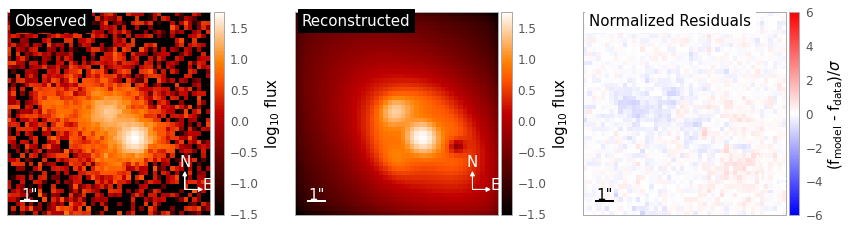

iteration of step 2 gave best reconstruction.
log likelihood before: -88.37853589169136 and log likelihood after: -84.1293277810432
iteration of step 0 gave best reconstruction.
log likelihood before: -827.3265269448967 and log likelihood after: -827.3265269448967
iteration of step 2 gave best reconstruction.
log likelihood before: -4552.378218735968 and log likelihood after: -4167.9951514936865
-1.6003311298738585 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.07951732304446428
reduced chi^2 of data  1 =  0.7819721426700348
reduced chi^2 of data  2 =  3.939503923907077


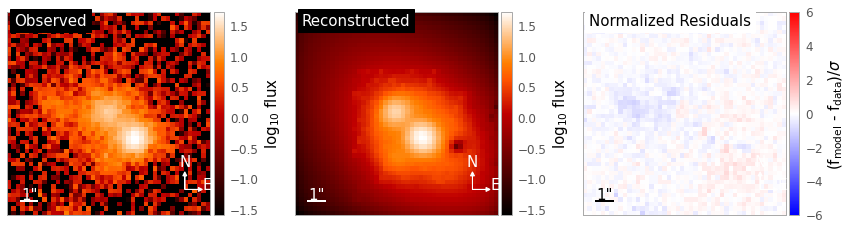

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-1.277167667520743 reduced X^2 of best position
-4030.741158695465 logL
6312 effective number of data points
[{'theta_E': 2.0868980054437, 'e1': -0.29379020839664277, 'e2': 0.24021494551389266, 'center_x': 0.9052789882211864, 'center_y': -1.4612020621005755}] lens result
[{'amp': 1, 'R_sersic': 4.9966744447914335, 'n_sersic': 3.5564418636557154, 'e1': -0.04239144031220283, 'e2': -0.29998964012308743, 'center_x': 1.4301979723296216, 'center_y': -1.4203726366363147}] source result
[{'amp': 1, 'R_sersic': 0.2570843620384206, 'n_sersic': 1.4535375871106397, 'e1': 0.016515114090919634, 'e2': -0.07699893187751515, 'center_x': 1.5514551915752341, 'center_y': -1.4518714171156126}] lens light result
[{'ra_image': array([-0.09999598,  0.01030074,  3.60999877]), 'dec_image': array([ 0.07211329,

100%|█████████████████████████████████████████| 800/800 [14:54<00:00,  1.12s/it]
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: invalid value encountered in log10
  log_model = np.log10(model)
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  200
Sampling iterations (in current run): 800
896.2276737689972 time taken for MCMC sampling
-0.9766576648470989 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.07153659715164834
reduced chi^2 of data  1 =  0.4360125902040597
reduced chi^2 of data  2 =  2.422423807185589


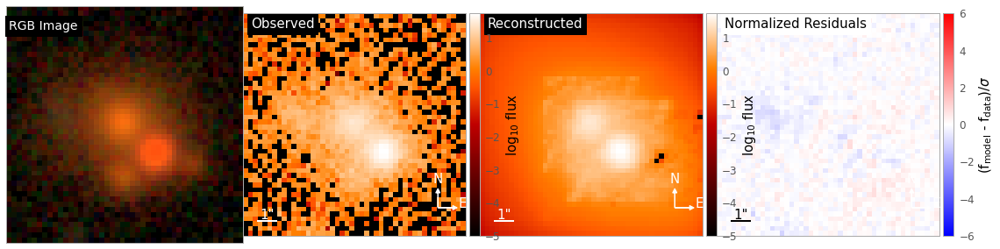

number of non-linear parameters in the MCMC process:  21
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  126000
126000
Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=2.09, e1=-0.3, e2=0.25, center_x=0.88, center_y=-1.49
Lens Light: amp=52601.78, R_sersic=0.2, n_sersic=0.51, e1=0.1, e2=0.01, center_x=1.55, center_y=-1.44
Source Light: amp=30.81, R_sersic=4.99, n_sersic=3.64, e1=-0.02, e2=-0.3, center_x=1.41,

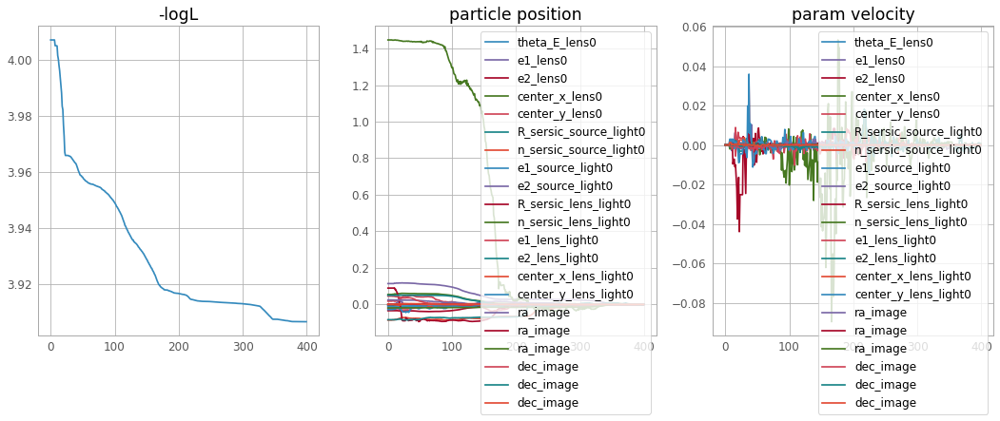

<Figure size 576x432 with 0 Axes>

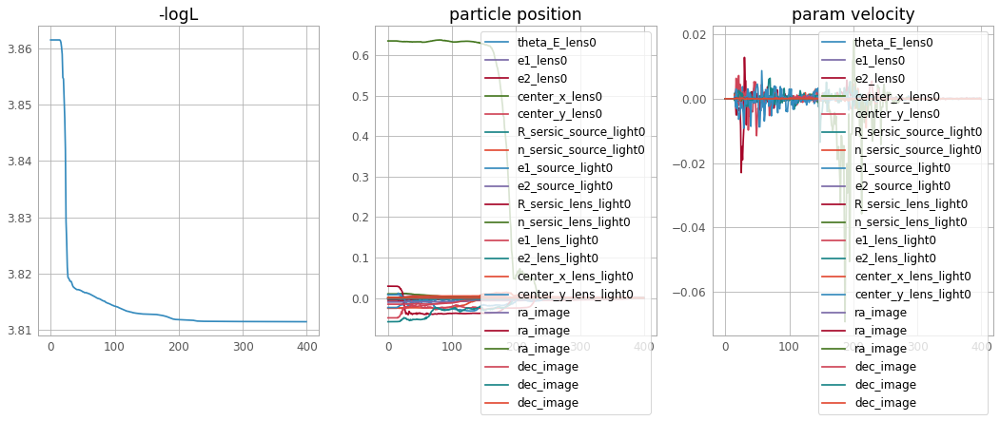

<Figure size 576x432 with 0 Axes>

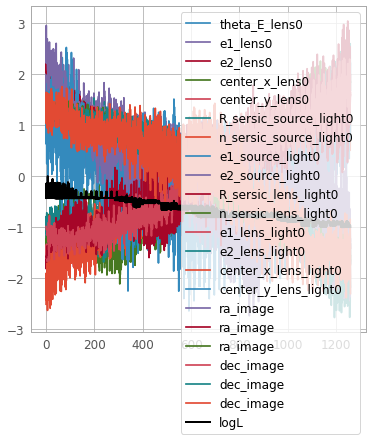

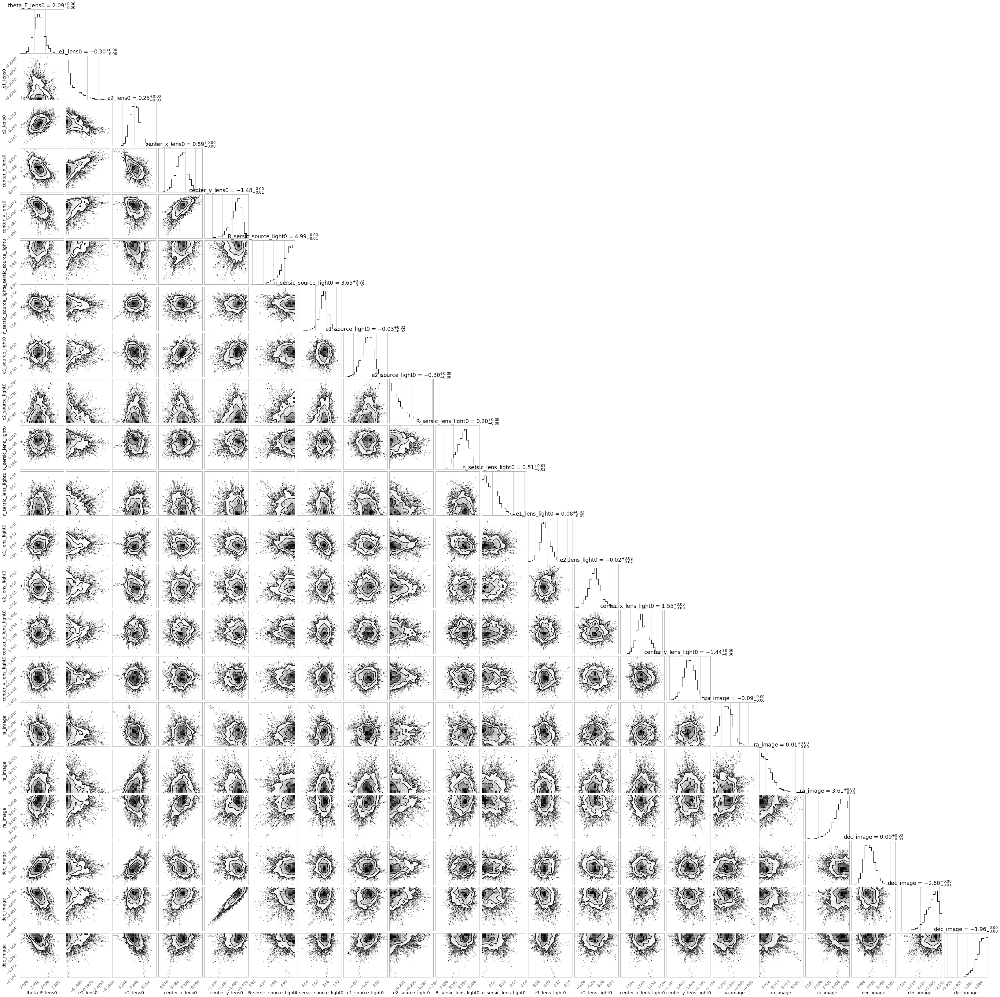

In [18]:
## DES_4414, coadd_id = 1087262176
# lens position:
center_x = 1.4
center_y = -1.6

# image positions:
x_images = [0.0,0.11,3.51]
y_images = [0.10,-2.69,-2.06]

# initial guesses for params
theta_E=approx_theta_E(center_x, center_y, x_images, y_images)
      
kwargs_lens_initial = {'theta_E': theta_E, 'e1': -0.05, 'e2': 0, 'center_x': center_x, 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 4, 'center_x': center_x, 'center_y': center_y, 'e1': 0.15, 'e2': -0.15}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': 0, 'e2': 0, 'center_x': center_x, 'center_y': center_y}

mem_usage = memory_usage((model, (1087262176, kwargs_lens_initial, kwargs_source_initial, 
                                  kwargs_lens_light_initial, x_images, y_images, None, ), ))

print(f"Total Memory Usage: {mem_usage[-1]}")

### Comments:
* did not converge on any of three PSOs
* PSO times: 800, 820, 580
* Final PSF reconstruction: step 0 gave best reconstruction
* MCMC (200, 600) time: 15 min
* memory usage: 1050

'Estimated theta_E': 2.36


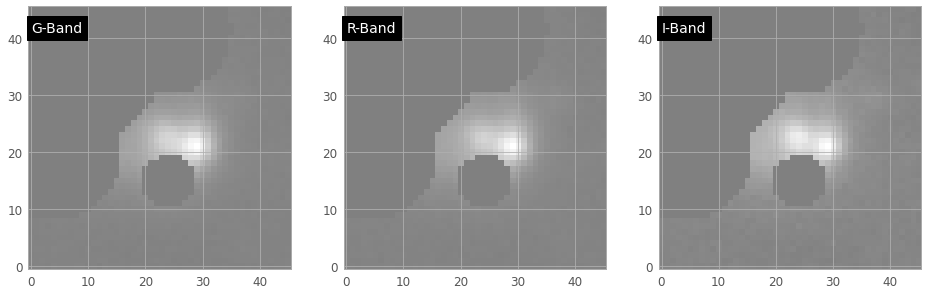

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-10.735819490746408 reduced X^2 of best position
-33909.08586152253 logL
6317 effective number of data points
[{'theta_E': 2.8509931891220797, 'e1': 0.24883471727801806, 'e2': -0.2846450829498348, 'center_x': 1.8675222299234637, 'center_y': -0.9481844421514029}] lens result
[{'amp': 1, 'R_sersic': 2.29386941644848, 'n_sersic': 0.5001086023319176, 'e1': 0.2999505927004793, 'e2': 0.2998484078106235, 'center_x': 2.079652576276468, 'center_y': -1.0510651346289779}] source result
[{'amp': 1, 'R_sersic': 1.0409034763501015, 'n_sersic': 1.023216321667138, 'e1': 0.1720289645324905, 'e2': -0.17509217280819817, 'center_x': 1.3928375161815618, 'center_y': -0.17246206208847553}] lens light result
[{'ra_image': array([ 3.68877289, -0.06999847]), 'dec_image': array([ 1.55379233, -0.06166865]), 'po

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


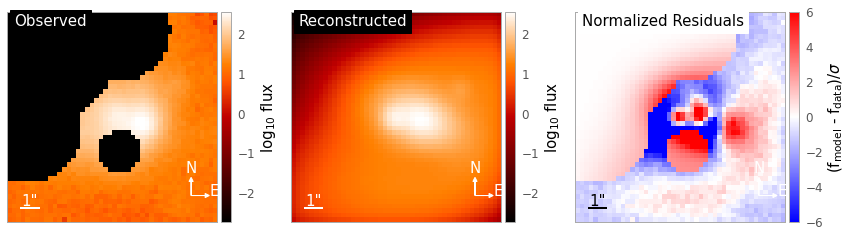

iteration of step 4 gave best reconstruction.
log likelihood before: -7183.952797295215 and log likelihood after: -7001.692690845679
iteration of step 3 gave best reconstruction.
log likelihood before: -12705.182796028334 and log likelihood after: -12267.428906869996
iteration of step 9 gave best reconstruction.
log likelihood before: -14019.917558816229 and log likelihood after: -12602.795231418917
-10.041561697899997 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  6.617856985676446
reduced chi^2 of data  1 =  11.594923352429106
reduced chi^2 of data  2 =  11.91190475559444


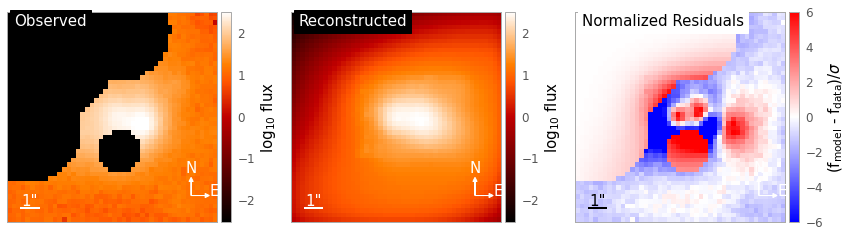

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-8.873810292808917 reduced X^2 of best position
-28027.929809836965 logL
6317 effective number of data points
[{'theta_E': 3.060693410783506, 'e1': 0.26902897241150364, 'e2': -0.015321001988654635, 'center_x': 2.1902681576216536, 'center_y': -0.9304515583586921}] lens result
[{'amp': 1, 'R_sersic': 2.063007220712696, 'n_sersic': 0.5000001061830903, 'e1': 0.29999626101069826, 'e2': 0.29768399391214695, 'center_x': 2.378845166908217, 'center_y': -1.4353850505907224}] source result
[{'amp': 1, 'R_sersic': 0.6406169723897123, 'n_sersic': 1.0080088826223579, 'e1': -0.07805108620126681, 'e2': -0.29999617346667573, 'center_x': 1.5892874374980877, 'center_y': -0.23323676263487136}] lens light result
[{'ra_image': array([ 3.59012956, -0.06990008]), 'dec_image': array([ 1.51000105, -0.03231229

100%|█████████████████████████████████████████| 800/800 [09:32<00:00,  1.40it/s]


Computing the MCMC...
Number of walkers =  190
Burn-in iterations:  200
Sampling iterations (in current run): 800
573.9719729423523 time taken for MCMC sampling
-7.56348194603783 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  4.765395168203734
reduced chi^2 of data  1 =  9.44035716770619
reduced chi^2 of data  2 =  8.484693502203562


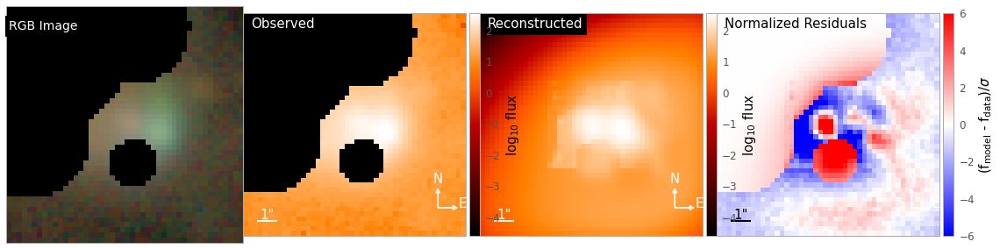

number of non-linear parameters in the MCMC process:  19
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  114000
114000


Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=3.05, e1=0.3, e2=0.04, center_x=2.14, center_y=-0.76
Lens Light: amp=5881.62, R_sersic=0.51, n_sersic=1.18, e1=-0.08, e2=-0.3, center_x=1.66, center_y=-0.25
Source Light: amp=209.33, R_sersic=1.92, n_sersic=0.51, e1=0.3, e2=0.3, center_x=2.4, center_y=-1.36
Point Source Positions: x_images=[3.6, -0.07], y_images=[1.52, -0.04]
Total Memory Usage: 885.10546875


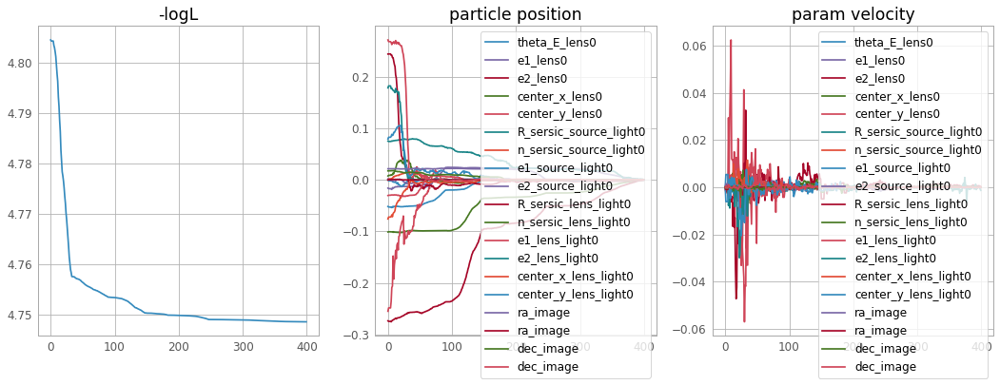

<Figure size 576x432 with 0 Axes>

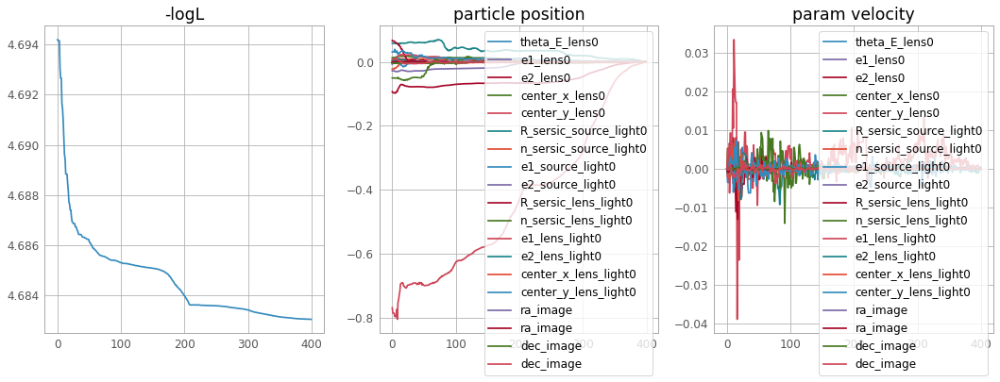

<Figure size 576x432 with 0 Axes>

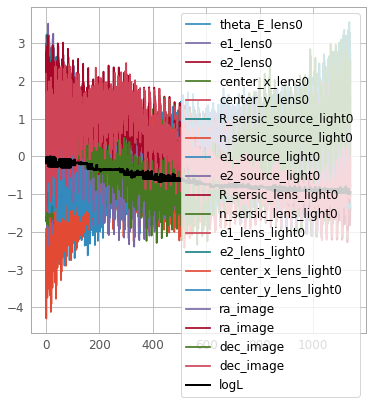

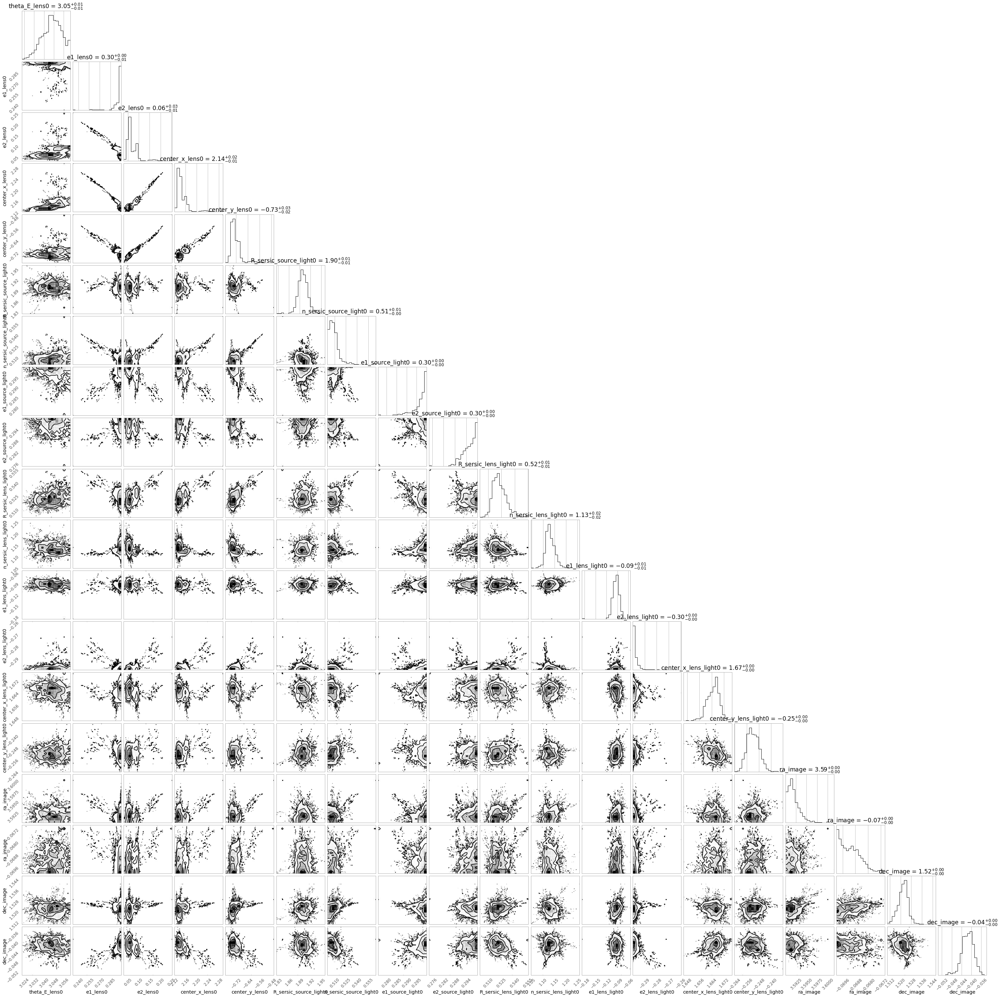

In [20]:
## DES_0041, coadd_id = 1325853948
center_x = 1.6
center_y = -0.6

x_images = [3.69,0.03]
y_images = [1.61,0.0]

theta_E=approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0.2, 'e2': 0, 'center_x': center_x, 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 3, 'center_x': center_x, 'center_y': center_y, 'e1': -0.1, 'e2': 0.1}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': 0, 'e2': 0, 'center_x': center_x, 'center_y': center_y}

mem_usage = memory_usage((model, (1325853948, 
      kwargs_lens_initial, kwargs_source_initial, kwargs_lens_light_initial,
      x_images, y_images,
      [{'mask_center_x': 0.4, 'mask_center_y': -2, 'mask_radius': 1.2}, 
                   {'mask_center_x': -5, 'mask_center_y': 5, 'mask_radius': 5.7}, 
                   {'mask_center_x': 0.3, 'mask_center_y': 5, 'mask_radius': 3},
                   {'mask_center_x': -4.8, 'mask_center_y': -0.8, 'mask_radius': 3}]), ))

print(f"Total Memory Usage: {mem_usage[-1]}")

### Comments: 
* Did not converge on any PSO runs
    * Times for PSO: 630, 510, 500
* total memory usage: 885
* final PSF reconstruction: step 0 gave the best reconstruction (except r band was step 1)
* MCMC time: 10 minutes

'Estimated theta_E': 1.68


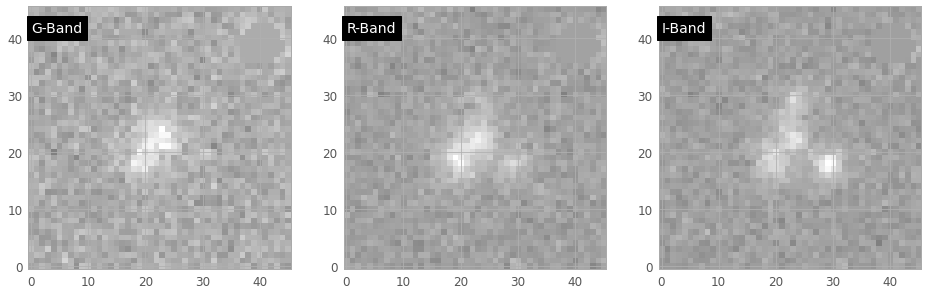

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-0.1750328869356263 reduced X^2 of best position
-552.4037911688366 logL
6312 effective number of data points
[{'theta_E': 1.733564808160226, 'e1': 0.18029932450502847, 'e2': 0.17701228201029134, 'center_x': 0.11106415406742483, 'center_y': -0.4822528939333002}] lens result
[{'amp': 1, 'R_sersic': 1.4467275446146162, 'n_sersic': 1.9671547466130515, 'e1': 0.2979676840819227, 'e2': -0.06627521639459556, 'center_x': 0.2345168466309382, 'center_y': -0.22917529163869096}] source result
[{'amp': 1, 'R_sersic': 0.8851718304518424, 'n_sersic': 0.6771149980256748, 'e1': -0.20080808736849973, 'e2': 0.2616962321843663, 'center_x': -0.14607306748024823, 'center_y': -0.22089682037770697}] lens light result
[{'ra_image': array([-0.07146796, -0.98197865,  1.66999506]), 'dec_image': array([ 1.573392

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: invalid value encountered in log10
  log_model = np.log10(model)
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


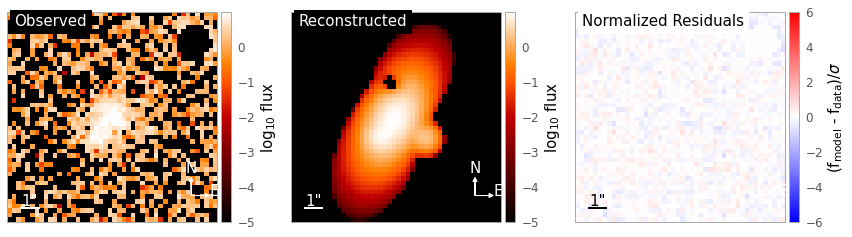

iteration of step 4 gave best reconstruction.
log likelihood before: -67.14362530682402 and log likelihood after: -67.11697463782033
iteration of step 13 gave best reconstruction.
log likelihood before: -105.61142509441913 and log likelihood after: -102.73306167940048
iteration of step 11 gave best reconstruction.
log likelihood before: -379.64351640527855 and log likelihood after: -369.25180159989725
-0.16984935032045306 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.06343759417563359
reduced chi^2 of data  1 =  0.09710119251361103
reduced chi^2 of data  2 =  0.3490092642721146


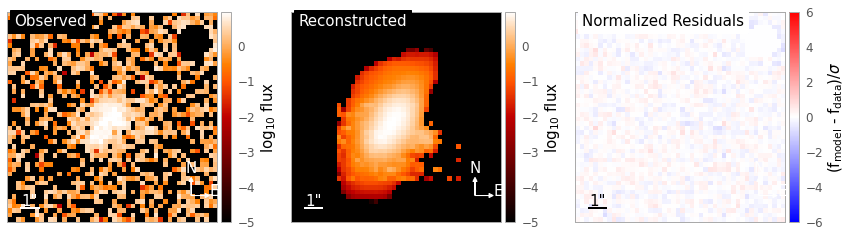

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
Max iteration reached! Stopping.
-0.16953201914523308 reduced X^2 of best position
-535.0430524223556 logL
6312 effective number of data points
[{'theta_E': 1.7352861375068538, 'e1': 0.18349076221053845, 'e2': 0.17695089899176394, 'center_x': 0.11847559841232064, 'center_y': -0.48292983113497423}] lens result
[{'amp': 1, 'R_sersic': 1.4328107388053932, 'n_sersic': 1.9724978883299908, 'e1': 0.2984523814142523, 'e2': -0.2995662734462666, 'center_x': 0.2504084290707833, 'center_y': -0.23376681972850552}] source result
[{'amp': 1, 'R_sersic': 0.7042049284186626, 'n_sersic': 1.1431479536218965, 'e1': -0.2007640276514933, 'e2': 0.25612406217812933, 'center_x': -0.04434175717822792, 'center_y': -0.11356911890524188}] lens light result
[{'ra_image': array([-0.03746603, -0.98156968,  1.66999985]), 'dec_image': array([ 1.5732

100%|█████████████████████████████████████████| 800/800 [13:10<00:00,  1.01it/s]


Computing the MCMC...
Number of walkers =  210
Burn-in iterations:  200
Sampling iterations (in current run): 800
791.9124021530151 time taken for MCMC sampling
-0.16114119772705102 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.061260255439525686
reduced chi^2 of data  1 =  0.09494867448613573
reduced chi^2 of data  2 =  0.32721466325549164


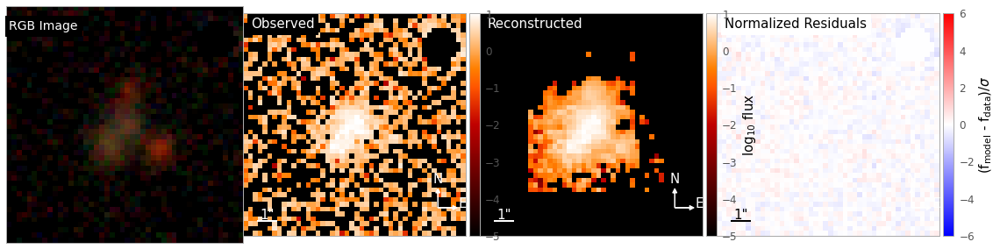

number of non-linear parameters in the MCMC process:  21
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_source_light0', 'n_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  126000
126000
Summary
Fixed parameters:
Choices: number of images, no external shear, psf_type, lens model: SIE, light model: SERSIC_ELLIPSE 
From images: image data, fwhm, background noise, numPix & deltaPix, exposure time
Free Parameters: 
Lens: theta_E=1.73, e1=0.17, e2=0.17, center_x=0.14, center_y=-0.47
Lens Light: amp=335.98, R_sersic=0.57, n_sersic=1.14, e1=-0.17, e2=0.24, center_x=-0.06, center_y=-0.12
Source Light: amp=-13.24, R_sersic=1.24, n_sersic=1.97, e1=-0.21, e2=-0.3, center_x=0.

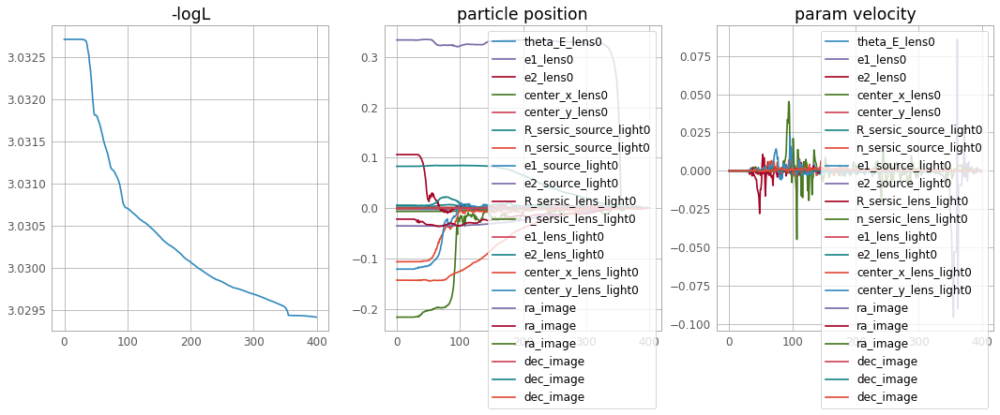

<Figure size 576x432 with 0 Axes>

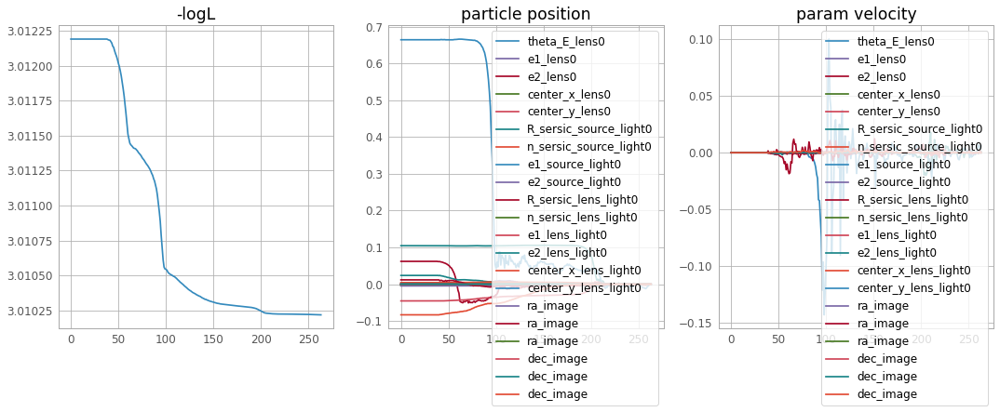

<Figure size 576x432 with 0 Axes>

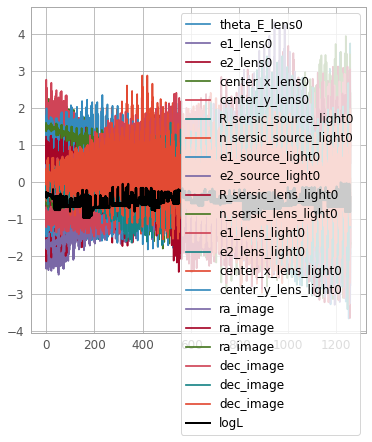

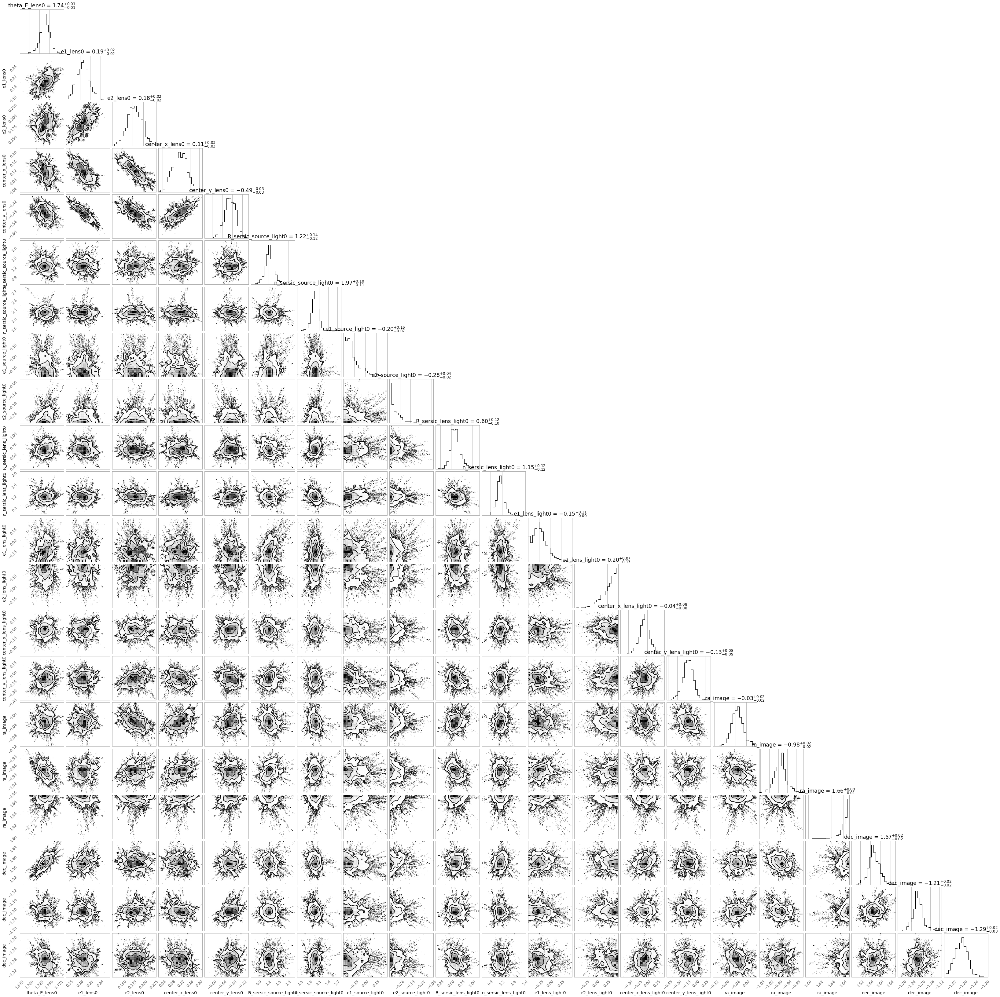

In [21]:
## DES_2915, coadd_id = 1400263522

# image positions
x_images = [-0.06,-0.99,1.57]
y_images = [1.56,-1.21,-1.25]

# lens position
center_x = 0
center_y = -0.25

# initial guesses for params
theta_E=approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0.15, 'e2': 0.1, 'center_x': center_x , 'center_y': center_y}
kwargs_source_initial = {'R_sersic': 1, 'n_sersic': 2.5, 'center_x': center_x, 'center_y': center_y, 'e1': 0.1, 'e2': 0.}
kwargs_lens_light_initial= {'R_sersic': 1, 'n_sersic': 2, 'e1': -0.15, 'e2': 0.0, 'center_x': center_x , 'center_y': center_y}

mem_usage = memory_usage((model, (1400263522, kwargs_lens_initial, kwargs_source_initial, kwargs_lens_light_initial,
      x_images, y_images,
      [{'mask_center_x': 4.7, 'mask_center_y': 4.3, 'mask_radius': 1}]
     ), ))

print(f"Total Memory Usage: {mem_usage[-1]}")


### Comments
* First and second PSO did not converge
* Final PSO Converged after 264 iterations
* PSO Times: 980, 870, 570
* Total memory usage: 1036
* Final PSF completed after 2 iterations
* MCMC time: 13 minutes